<a href="https://colab.research.google.com/github/Msyed15/Maestro-Piano-Project/blob/main/Final_Maestro_Piano_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Generative Piano Music Model

> Trained on Maestro Dataset



# Installations for Model:

In [ ]:
!sudo apt install -y fluidsynth

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  fluid-soundfont-gm libevdev2 libfluidsynth3 libgudev-1.0-0 libinput-bin
  libinput10 libinstpatch-1.0-2 libmd4c0 libmtdev1 libqt5core5a libqt5dbus5
  libqt5gui5 libqt5network5 libqt5svg5 libqt5widgets5 libwacom-bin
  libwacom-common libwacom9 libxcb-icccm4 libxcb-image0 libxcb-keysyms1
  libxcb-render-util0 libxcb-util1 libxcb-xinerama0 libxcb-xinput0 libxcb-xkb1
  libxkbcommon-x11-0 qsynth qt5-gtk-platformtheme qttranslations5-l10n
  timgm6mb-soundfont
Suggested packages:
  fluid-soundfont-gs qt5-image-formats-plugins qtwayland5 jackd
The following NEW packages will be installed:
  fluid-soundfont-gm fluidsynth libevdev2 libfluidsynth3 libgudev-1.0-0
  libinput-bin libinput10 libinstpatch-1.0-2 libmd4c0 libmtdev1 libqt5core5a
  libqt5dbus5 libqt5gui5 libqt5network5 libqt5svg5 libqt5widgets5 libwacom-bin
  libwacom-common libwacom9 libx

In [ ]:
!pip install --upgrade pyfluidsynth

In [ ]:
!pip install pretty_midi

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 18.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.3/50.3 kB 7.4 MB/s eta 0:00:00
  Created wheel for pretty_midi: filename=pretty_midi-0.2.10-py3-none-any.whl size=5592284 sha256=cf0237338dbd5bb72f46adcce6bd70b7cdaf7ec911ac992a857e9fc11caa51f0
  Stored in directory: /root/.cache/pip/wheels/cd/a5/30/7b8b7f58709f5150f67f98fde4b891ebf0be9ef07a8af49f25
Successfully built pretty_midi


# Imported Libraries for Model:

In [ ]:
import collections
import datetime
import fluidsynth
import glob
import numpy as np
import pathlib
import pandas as pd
import pretty_midi
import seaborn as sns
import tensorflow as tf

from IPython import display
from matplotlib import pyplot as plt
from typing import Optional

# Downloading & Examining Data:

In [ ]:
#setting seed
seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)

# Sampling rate for audio playback
_SAMPLING_RATE = 16000

In [ ]:
#Downloading Maestro Dataset
data_dir = pathlib.Path('data/maestro-v3.0.0')
if not data_dir.exists():
  tf.keras.utils.get_file(
      'maestro-v3.0.0-midi.zip',
      origin='https://storage.googleapis.com/magentadata/datasets/maestro/v3.0.0/maestro-v3.0.0-midi.zip',
      extract=True,
      cache_dir='.', cache_subdir='data',
  )

58416533/58416533 [==============================] - 1s 0us/step


In [ ]:
filenames = glob.glob(str(data_dir/'**/*.mid*'))
print('Number of files:', len(filenames))

Number of files: 1276


In [ ]:
#reterving one file to sample
sample_file = filenames[30]
print(sample_file)

data/maestro-v3.0.0/2017/MIDI-Unprocessed_067_PIANO067_MID--AUDIO-split_07-07-17_Piano-e_3-03_wav--1.midi


In [ ]:
#Looking at all file names.
print(*filenames, sep = '\n')

data/maestro-v3.0.0/2017/MIDI-Unprocessed_049_PIANO049_MID--AUDIO-split_07-06-17_Piano-e_2-06_wav--2.midi
data/maestro-v3.0.0/2017/MIDI-Unprocessed_067_PIANO067_MID--AUDIO-split_07-07-17_Piano-e_3-03_wav--4.midi
data/maestro-v3.0.0/2017/MIDI-Unprocessed_049_PIANO049_MID--AUDIO-split_07-06-17_Piano-e_2-06_wav--4.midi
data/maestro-v3.0.0/2017/MIDI-Unprocessed_054_PIANO054_MID--AUDIO-split_07-07-17_Piano-e_1-02_wav--2.midi
data/maestro-v3.0.0/2017/MIDI-Unprocessed_044_PIANO044_MID--AUDIO-split_07-06-17_Piano-e_1-04_wav--2.midi
data/maestro-v3.0.0/2017/MIDI-Unprocessed_058_PIANO058_MID--AUDIO-split_07-07-17_Piano-e_2-02_wav--1.midi
data/maestro-v3.0.0/2017/MIDI-Unprocessed_062_PIANO062_MID--AUDIO-split_07-07-17_Piano-e_2-07_wav--1.midi
data/maestro-v3.0.0/2017/MIDI-Unprocessed_060_PIANO060_MID--AUDIO-split_07-07-17_Piano-e_2-04_wav--2.midi
data/maestro-v3.0.0/2017/MIDI-Unprocessed_052_PIANO052_MID--AUDIO-split_07-06-17_Piano-e_3-03_wav--3.midi
data/maestro-v3.0.0/2017/MIDI-Unprocessed_051_

# Examining CSV:

In [ ]:
csv = '/content/data/maestro-v3.0.0/maestro-v3.0.0.csv'
df_mas = pd.read_csv(csv)

In [ ]:
df_mas.head(10)

,canonical_composer,canonical_title,split,year,midi_filename,audio_filename,duration
0,Alban Berg,Sonata Op. 1,train,2018,2018/MIDI-Unprocessed_Chamber3_MID--AUDIO_10_R...,2018/MIDI-Unprocessed_Chamber3_MID--AUDIO_10_R...,698.661160
1,Alban Berg,Sonata Op. 1,train,2008,2008/MIDI-Unprocessed_03_R2_2008_01-03_ORIG_MI...,2008/MIDI-Unprocessed_03_R2_2008_01-03_ORIG_MI...,759.518471
2,Alban Berg,Sonata Op. 1,train,2017,2017/MIDI-Unprocessed_066_PIANO066_MID--AUDIO-...,2017/MIDI-Unprocessed_066_PIANO066_MID--AUDIO-...,464.649433
3,Alexander Scriabin,"24 Preludes Op. 11, No. 13-24",train,2004,2004/MIDI-Unprocessed_XP_21_R1_2004_01_ORIG_MI...,2004/MIDI-Unprocessed_XP_21_R1_2004_01_ORIG_MI...,872.640588
4,Alexander Scriabin,"3 Etudes, Op. 65",validation,2006,2006/MIDI-Unprocessed_17_R1_2006_01-06_ORIG_MI...,2006/MIDI-Unprocessed_17_R1_2006_01-06_ORIG_MI...,397.857508
5,Alexander Scriabin,"5 Preludes, Op.15",validation,2009,2009/MIDI-Unprocessed_07_R1_2009_04-05_ORIG_MI...,2009/MIDI-Unprocessed_07_R1_2009_04-05_ORIG_MI...,400.557826
6,Alexander Scriabin,"Entragete, Op.63",test,2009,2009/MIDI-Unprocessed_11_R1_2009_06-09_ORIG_MI...,2009/MIDI-Unprocessed_11_R1_2009_06-09_ORIG_MI...,163.745830
7,Alexander Scriabin,"Etude Op. 2 No.1; Etudes Op. 8, Nos. 5, 11 an...",train,2013,2013/ORIG-MIDI_03_7_8_13_Group__MID--AUDIO_19_...,2013/ORIG-MIDI_03_7_8_13_Group__MID--AUDIO_19_...,563.904351
8,Alexander Scriabin,"Etude Op. 42, Nos. 4 & 5",test,2009,2009/MIDI-Unprocessed_02_R1_2009_03-06_ORIG_MI...,2009/MIDI-Unprocessed_02_R1_2009_03-06_ORIG_MI...,136.315302
9,Alexander Scriabin,"Etude Op. 8, No. 13",validation,2009,2009/MIDI-Unprocessed_02_R1_2009_03-06_ORIG_MI...,2009/MIDI-Unprocessed_02_R1_2009_03-06_ORIG_MI...,167.085837


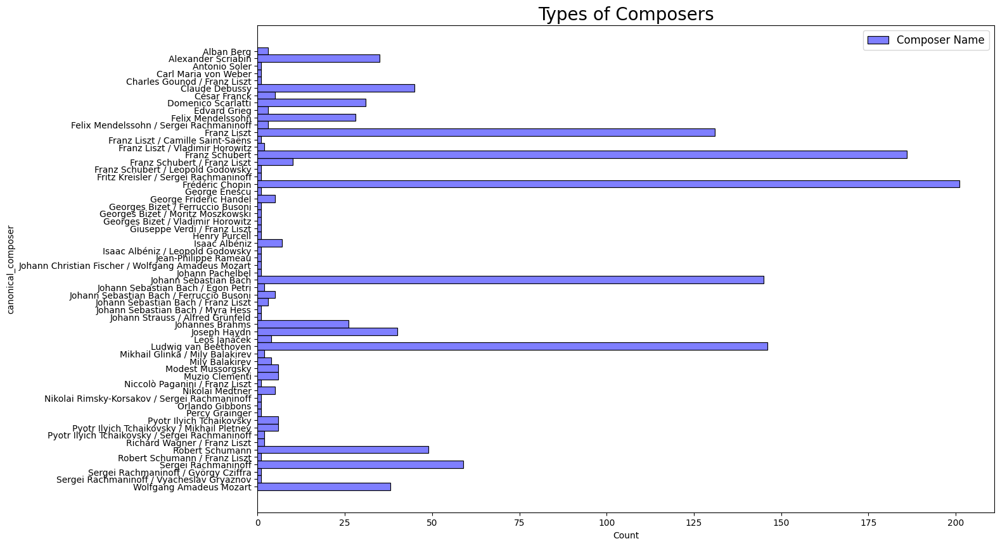

In [ ]:
plt.figure(figsize= (15,10))
plt.title("Types of Composers", fontsize = 20)
sns.histplot(data = df_mas, y = 'canonical_composer', bins = 50, color = 'blue', alpha = 0.5, label = "Composer Name")
plt.legend(loc = 'best', fontsize = 12)

# Pretty MIDI & Dr. Hawley's MIDI Display

In [ ]:
#Generate Pretty MIDI object for the file
pm = pretty_midi.PrettyMIDI(sample_file)

In [ ]:
#hawley's midi player stuff

# styling function
def make_player_html(midi_file_url): # this works with a local file too
    return '''
<script src="https://cdn.jsdelivr.net/combine/npm/tone@14.7.58,npm/@magenta/music@1.23.1/es6/core.js,npm/focus-visible@5,npm/html-midi-player@1.5.0"></script>

<style>
/* Custom player style */
#section3 midi-player {
  display: block;
  width: inherit;
  margin: 4px;
  margin-bottom: 0;
}
#section3 midi-player::part(control-panel) {
  background: #ff5;
  border: 2px solid #000;
  border-radius: 10px 10px 0 0;
}
#section3 midi-player::part(play-button) {
  color: #353;
  border: 2px solid currentColor;
  background-color: #4d4;
  border-radius: 20px;
  transition: all 0.2s;
  content: 'hello';
}
#section3 midi-player::part(play-button):hover {
  color: #0a0;
  background-color: #5f5;
  border-radius: 10px;
}
#section3 midi-player::part(time) {
  font-family: monospace;
}

/* Custom visualizer style */
#section3 midi-visualizer .piano-roll-visualizer {
  background: #ffd;
  border: 2px solid black;
  border-top: none;
  border-radius: 0 0 10px 10px;
  margin: 4px;
  width: inherit;
  margin-top: 0;
  overflow: auto;
}
#section3 midi-visualizer svg rect.note {
  opacity: 0.6;
  stroke-width: 2;
}
#section3 midi-visualizer svg rect.note[data-instrument="0"]{
  fill: #e22;
  stroke: #500;
}
#section3 midi-visualizer svg rect.note[data-instrument="2"]{
  fill: #2ee;
  stroke: #055;
}
#section3 midi-visualizer svg rect.note[data-is-drum="true"]{
  fill: #888;
  stroke: #888;
}
#section3 midi-visualizer svg rect.note.active {
  opacity: 0.9;
  stroke: #000;
  stroke-width: 3;
}
</style>
''' + f'''
<section id="section3">
<midi-player
  src={midi_file_url}
  sound-font visualizer="#section3 midi-visualizer">
</midi-player>
<midi-visualizer
  src={midi_file_url}>
</midi-visualizer>
</section>
'''

# player object

from html import escape
from IPython.display import IFrame
import json
import os
import base64


class MIDIPlayer:
    """
    Original code from Tony Hirsh: https://blog.ouseful.info/2021/11/24/fragment-embedding-srcdoc-iframes-in-jupyter-notebooks/
    Modified by Scott H. Hawley @drscotthawley
    """
    def __init__(self,
                 html_or_filename,
                 height,
                 width='100%',
                 ratio=1,
                 player_html_maker=None, # callback function for formatting the player html
                 debug=True,):
        self.width = width
        self.height = height
        self.ratio = ratio
        # some way to detect if we got a filename? probly a better way to do this.
        if os.path.isfile(html_or_filename):
            self.html = self.to_player_url(html_or_filename, player_html_maker=player_html_maker)
        else:
            if debug: print(f"No file {html_or_filename} found, so treating input as raw HTML")
            self.html = html_or_filename


    def _repr_html_(self, **kwargs):
        """Displays the Diagram in a Jupyter notebook."""
        html = escape(self.html)
        if self.height is None: # SHH: notebook doesn't need to be Trusted when you specify a height
            iframe = (
                '<div style="width:{width};">'
                '<div style="position:relative;width:100%;height:0;padding-bottom:{ratio};">'  # noqa
                '<span style="color:#565656">Make this Notebook Trusted to load map: File -> Trust Notebook</span>'  # noqa
                '<iframe srcdoc="{html}" style="position:absolute;width:100%;height:100%;left:0;top:0;'  # noqa
                'border:none !important;" '
                'allowfullscreen webkitallowfullscreen mozallowfullscreen>'
                '</iframe>'
                '</div></div>'
            ).format(html=html, width=self.width, ratio=self.ratio)
        else:
            iframe = f'''<iframe srcdoc="{html}" width="{self.width}" height="{self.height}"
                style="border:none !important;"
                "allowfullscreen" "webkitallowfullscreen" "mozallowfullscreen">'
                </iframe>'''
        return iframe

    def to_player_url(self, midi_filename, player_html_maker=None):
        data_url = self.to_data_url(midi_filename)
        if player_html_maker is None:  # basic style unless otherwise specified
            player_html_maker = lambda url:  f'''
                <script src="https://cdn.jsdelivr.net/combine/npm/tone@14.7.58,npm/@magenta/music@1.23.1/es6/core.js,npm/focus-visible@5,npm/html-midi-player@1.5.0"></script>

                <midi-player
                src="{midi_file_url}"
                sound-font visualizer="#myVisualizer">
                </midi-player>
                <midi-visualizer type="piano-roll" id="myVisualizer"></midi-visualizer>
                '''
        return player_html_maker(data_url)


    def to_data_url(self, midi_filename):
        with open(midi_filename, "rb") as f:
            encoded_string = base64.b64encode(f.read())
        return 'data:audio/midi;base64,'+encoded_string.decode('utf-8')

    def toJson(self):
        return json.dumps(self, default=lambda o: o.__dict__)

    def to_wandb(self): # use with wandb.Html()
        return self.html

    def __getitem__(self, idx, **kwargs):
        return self.html[idx]


# Displaying Sampled Audio File & Analyzing Notes

In [ ]:
def display_audio(pm: pretty_midi.PrettyMIDI, seconds=30):
  waveform = pm.fluidsynth(fs=_SAMPLING_RATE)
  # Take a sample of the generated waveform to mitigate kernel resets
  waveform_short = waveform[:seconds*_SAMPLING_RATE]
  return display.Audio(waveform_short, rate=_SAMPLING_RATE)

In [ ]:
display_audio(pm)

In [ ]:
#Inspection of the MIDI file

print('Number of instruments:', len(pm.instruments))
instrument = pm.instruments[0]
instrument_name = pretty_midi.program_to_instrument_name(instrument.program)
print('Instrument name:', instrument_name)

Number of instruments: 1
Instrument name: Acoustic Grand Piano


In [ ]:
#Extract the notes
for i, note in enumerate(instrument.notes[:10]):
  note_name = pretty_midi.note_number_to_name(note.pitch)
  duration = note.end - note.start
  print(f'{i}: pitch={note.pitch}, note_name={note_name},'
        f' duration={duration:.4f}')

0: pitch=69, note_name=A4, duration=0.0750
1: pitch=71, note_name=B4, duration=0.0844
2: pitch=72, note_name=C5, duration=0.0354
3: pitch=76, note_name=E5, duration=0.0385
4: pitch=45, note_name=A2, duration=0.7708
5: pitch=72, note_name=C5, duration=0.0427
6: pitch=57, note_name=A3, duration=0.0687
7: pitch=56, note_name=G#3, duration=0.0667
8: pitch=69, note_name=A4, duration=0.0510
9: pitch=57, note_name=A3, duration=0.0563


In [ ]:
#pitch: perceptual quality of the sound as a MIDI note number
#step: time elapsed from the previous note or start of the track
#duration: how long the note will be playing in seconds and is the difference between the note end and note start times.

#Extract the notes from the sample MIDI file
def midi_to_notes(midi_file: str) -> pd.DataFrame:
  pm = pretty_midi.PrettyMIDI(midi_file)
  instrument = pm.instruments[0]
  notes = collections.defaultdict(list)

  # Sort the notes by start time
  sorted_notes = sorted(instrument.notes, key=lambda note: note.start)
  prev_start = sorted_notes[0].start

  for note in sorted_notes:
    start = note.start
    end = note.end
    notes['pitch'].append(note.pitch)
    notes['start'].append(start)
    notes['end'].append(end)
    notes['step'].append(start - prev_start)
    notes['duration'].append(end - start)
    prev_start = start

  return pd.DataFrame({name: np.array(value) for name, value in notes.items()})

In [ ]:
raw_notes = midi_to_notes(sample_file)
raw_notes.head()

,pitch,start,end,step,duration
0,45,1.029167,1.800000,0.000000,0.770833
1,69,1.054167,1.129167,0.025000,0.075000
2,71,1.159375,1.243750,0.105208,0.084375
3,72,1.276042,1.311458,0.116667,0.035417
4,76,1.553125,1.591667,0.277083,0.038542


In [ ]:
#convereting pitch value to note name
get_note_names = np.vectorize(pretty_midi.note_number_to_name)
sample_note_names = get_note_names(raw_notes['pitch'])
sample_note_names[:10]

array(['A2', 'A4', 'B4', 'C5', 'E5', 'A3', 'C5', 'G#3', 'A3', 'A4'],
      dtype='<U3')

In [ ]:
#Plot first 100 notes of piano roll

def plot_piano_roll(notes: pd.DataFrame, count: Optional[int] = None):
  if count:
    title = f'First {count} notes'
  else:
    title = f'Whole track'
    count = len(notes['pitch'])
  plt.figure(figsize=(20, 4))
  plot_pitch = np.stack([notes['pitch'], notes['pitch']], axis=0)
  plot_start_stop = np.stack([notes['start'], notes['end']], axis=0)
  plt.plot(
      plot_start_stop[:, :count], plot_pitch[:, :count], color="b", marker=".")
  plt.xlabel('Time [s]')
  plt.ylabel('Pitch')
  _ = plt.title(title)

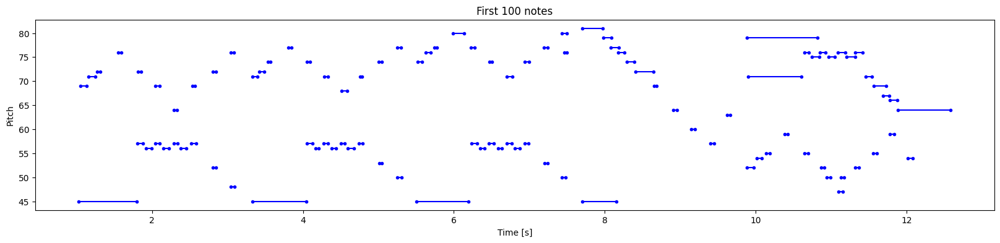

In [ ]:
plot_piano_roll(raw_notes, count=100)

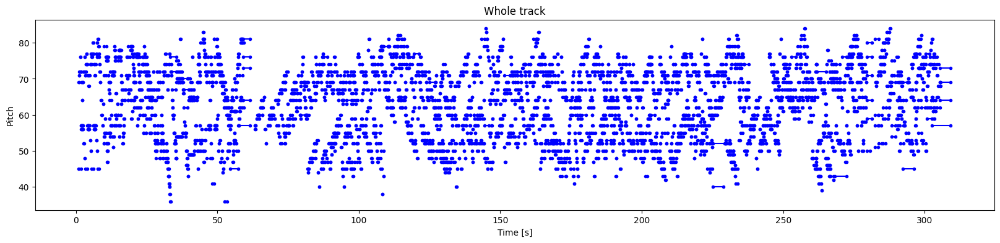

In [ ]:
#plot notes to entire track
plot_piano_roll(raw_notes)

In [ ]:
#checking distribution of each note
def plot_distributions(notes: pd.DataFrame, drop_percentile=2.5):
  plt.figure(figsize=[15, 5])
  plt.subplot(1, 3, 1)
  sns.histplot(notes, x="pitch", bins=20, color = "c")

  plt.subplot(1, 3, 2)
  max_step = np.percentile(notes['step'], 100 - drop_percentile)
  sns.histplot(notes, x="step", bins=np.linspace(0, max_step, 21), color = "purple")

  plt.subplot(1, 3, 3)
  max_duration = np.percentile(notes['duration'], 100 - drop_percentile)
  sns.histplot(notes, x="duration", bins=np.linspace(0, max_duration, 21),color = "pink")

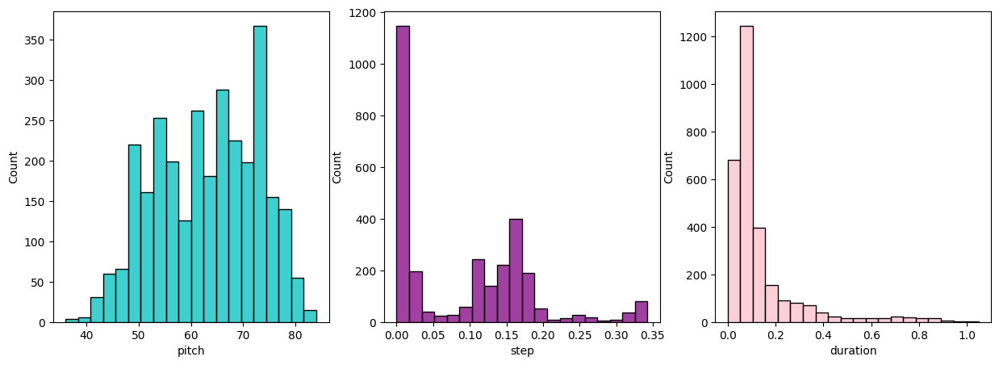

In [ ]:
plot_distributions(raw_notes)



# Generating Piano Music Based Off Of Sample File:

In [ ]:
#Creating own MIDI file from a list of notes
def notes_to_midi(
  notes: pd.DataFrame,
  out_file: str,
  instrument_name: str,
  velocity: int = 100,  # note loudness
) -> pretty_midi.PrettyMIDI:

  pm = pretty_midi.PrettyMIDI()
  instrument = pretty_midi.Instrument(
      program=pretty_midi.instrument_name_to_program(
          instrument_name))

  prev_start = 0
  for i, note in notes.iterrows():
    start = float(prev_start + note['step'])
    end = float(start + note['duration'])
    note = pretty_midi.Note(
        velocity=velocity,
        pitch=int(note['pitch']),
        start=start,
        end=end,
    )
    instrument.notes.append(note)
    prev_start = start

  pm.instruments.append(instrument)
  pm.write(out_file)
  return pm



In [ ]:
example_file = 'example.midi'
example_pm = notes_to_midi(
    raw_notes, out_file=example_file, instrument_name=instrument_name)

In [ ]:
#Generated MIDI file
display_audio(example_pm)

# Creating the Training Dataset:

In [ ]:
#create training dataset by extracting notes from list of files
num_files = 15 ###
all_notes = []
for f in filenames[:num_files]:
  notes = midi_to_notes(f)
  all_notes.append(notes)

all_notes = pd.concat(all_notes)

In [ ]:
n_notes = len(all_notes)
print('Number of notes parsed:', n_notes)

Number of notes parsed: 59378


In [ ]:
#create tf.Dataset from parsed notes
key_order = ['pitch', 'step', 'duration']
train_notes = np.stack([all_notes[key] for key in key_order], axis=1) #What if you put conditions on the step, duration, and pitch?

In [ ]:
notes_ds = tf.data.Dataset.from_tensor_slices(train_notes)
notes_ds.element_spec

TensorSpec(shape=(3,), dtype=tf.float64, name=None)

# Training the Model on Batches of Sequenced Notes:

In [ ]:
#Sequenced notes are the input features
#Next note is the label
#The model will be trained to pick the next note in the sequnece!

#Training the Model on Batches of Sequenced Notes
def create_sequences(
    dataset: tf.data.Dataset,
    seq_length: int,
    vocab_size = 128,
) -> tf.data.Dataset:
  """Returns TF Dataset of sequence and label examples."""
  seq_length = seq_length+1

  # Take 1 extra for the labels
  windows = dataset.window(seq_length, shift=1, stride=1,
                              drop_remainder=True)

  # `flat_map` flattens the" dataset of datasets" into a dataset of tensors
  flatten = lambda x: x.batch(seq_length, drop_remainder=True)
  sequences = windows.flat_map(flatten)

  # Normalize note pitch
  def scale_pitch(x):
    x = x/[vocab_size,1.0,1.0]
    return x

  # Split the labels
  def split_labels(sequences):
    inputs = sequences[:-1]
    labels_dense = sequences[-1]
    labels = {key:labels_dense[i] for i,key in enumerate(key_order)}

    return scale_pitch(inputs), labels

  return sequences.map(split_labels, num_parallel_calls=tf.data.AUTOTUNE)

Hyper Parameters in This Model:
> seq_length: length of each note

> vocab_size: the "vocabulary" of the piano

> temperature: randomness of each note


In [ ]:
#set the sequnce length for each example
seq_length = 25 #25
vocab_size = 128 #128
seq_ds = create_sequences(notes_ds, seq_length, vocab_size)
seq_ds.element_spec

(TensorSpec(shape=(25, 3), dtype=tf.float64, name=None),
 {'pitch': TensorSpec(shape=(), dtype=tf.float64, name=None),
  'step': TensorSpec(shape=(), dtype=tf.float64, name=None),
  'duration': TensorSpec(shape=(), dtype=tf.float64, name=None)})

In [ ]:
#shape is (100, 1) --> takes 100 notes as input and predicts the next note
for seq, target in seq_ds.take(1):
  print('sequence shape:', seq.shape)
  print('sequence elements (first 10):', seq[0: 10])
  print()
  print('target:', target)

sequence shape: (25, 3)
sequence elements (first 10): tf.Tensor(
[[0.6171875  0.         1.02604167]
 [0.484375   0.11666667 0.196875  ]
 [0.4609375  0.003125   0.22708333]
 [0.4296875  0.02291667 0.23541667]
 [0.609375   0.83854167 0.128125  ]
 [0.59375    0.096875   0.06875   ]
 [0.578125   0.08229167 0.09166667]
 [0.5859375  0.09375    0.090625  ]
 [0.59375    0.09583333 0.06770833]
 [0.5546875  0.08020833 0.10416667]], shape=(10, 3), dtype=float64)

target: {'pitch': <tf.Tensor: shape=(), dtype=float64, numpy=67.0>, 'step': <tf.Tensor: shape=(), dtype=float64, numpy=0.34375>, 'duration': <tf.Tensor: shape=(), dtype=float64, numpy=0.375>}


# Creating a Batch Size:

In [ ]:
#Batch the examples and configure the dataset for preformance
batch_size = 64
buffer_size = n_notes - seq_length  # the number of items in the dataset
train_ds = (seq_ds
            .shuffle(buffer_size)
            .batch(batch_size, drop_remainder=True)
            .cache()
            .prefetch(tf.data.experimental.AUTOTUNE))

In [ ]:
train_ds.element_spec

(TensorSpec(shape=(64, 25, 3), dtype=tf.float64, name=None),
 {'pitch': TensorSpec(shape=(64,), dtype=tf.float64, name=None),
  'step': TensorSpec(shape=(64,), dtype=tf.float64, name=None),
  'duration': TensorSpec(shape=(64,), dtype=tf.float64, name=None)})

# WandB to Help with Training:

Important to Determine:

> the Learning Rate (lr)

> amount of epochs

to see how it influences the accuracy and loss of the model.

In [ ]:
!pip install wandb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 11.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 23.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.0/254.0 kB 16.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.1 MB/s eta 0:00:00


In [ ]:
import wandb
import random

In [ ]:
#1d238fd4622d84a11ac108077a3949b2c7a151ba
#1d238fd4622d84a11ac108077a3949b2c7a151ba

In [ ]:
#logging into the wandb account need to provide API key when prompted
wandb.login()

<IPython.core.display.Javascript object>

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [ ]:
#Putting it all together
#Your training script might look similar to the following code example
#the highlighted code shows W&B-specific code

# train.py
import wandb
import random # for demo script

wandb.login()

epochs= 100
lr= 0.2
batch_size = 64


seq_length = 25 #hyperparameter
vocab_size = 128 #hyperparameter

run = wandb.init(
    # Set the project where this run will be logged
    project="Piano_Project",
    # Track hyperparameters and run metadata
    config={
        "learning_rate": lr,
        "architecture": "RNN",
        "seq_length": seq_length,
        "vocab_size": vocab_size,
        "bathc_size": batch_size,
        "dataset": "data/maestro-v3.0.0",
        "epochs": epochs,
    })

offset = random.random() / 5
print(f"lr: {lr}")

# simulating a training run
for epoch in range(2, epochs):
    acc = 1 - 2 ** -epoch - random.random() / epoch - offset
    loss = 2 ** -epoch + random.random() / epoch + offset
    print(f"epoch={epoch}, accuracy={acc}, loss={loss}")
    wandb.log({"accuracy": acc, "loss": loss})

# run.log_code()





wandb: Currently logged in as: sophiatheidea. Use `wandb login --relogin` to force relogin


lr: 0.2
epoch=2, accuracy=0.3872230014348722, loss=0.620703541088064
epoch=3, accuracy=0.5163610071803975, loss=0.5008654005968988
epoch=4, accuracy=0.798348292057681, loss=0.22788888790227838
epoch=5, accuracy=0.7473512253458685, loss=0.3128235847473467
epoch=6, accuracy=0.856695925337972, loss=0.18117997407068098
epoch=7, accuracy=0.7741109552215242, loss=0.17354447637772252
epoch=8, accuracy=0.834738583673957, loss=0.21182548781112992
epoch=9, accuracy=0.8857273943436055, loss=0.1282879153428414
epoch=10, accuracy=0.795556179891943, loss=0.20980469133788446
epoch=11, accuracy=0.8498537533445971, loss=0.13041095394741403
epoch=12, accuracy=0.8448568223302287, loss=0.1670857816079802
epoch=13, accuracy=0.858357056544721, loss=0.12876512423314057
epoch=14, accuracy=0.8654269825087506, loss=0.13380041084246802
epoch=15, accuracy=0.8299346181701704, loss=0.1384678767042389
epoch=16, accuracy=0.8628364692938288, loss=0.11785962513193701
epoch=17, accuracy=0.8581116177271222, loss=0.135559

# Creating & Training the Model:

Using determined Learning Rate, Epochs, Vocab Size, Sequence Length, Temperature


In [ ]:
#model will have 3 outputs (one for each note variable)
#for step & duration use custom loss function that encourages the model to use non-negative values
def mse_with_positive_pressure(y_true: tf.Tensor, y_pred: tf.Tensor):
  mse = (y_true - y_pred) ** 2
  positive_pressure = 10 * tf.maximum(-y_pred, 0.0)
  return tf.reduce_mean(mse + positive_pressure)

In [ ]:
input_shape = (seq_length, 3)
learning_rate = 0.2

inputs = tf.keras.Input(input_shape)
x = tf.keras.layers.LSTM(128)(inputs)

outputs = {
  'pitch': tf.keras.layers.Dense(128, name='pitch')(x),
  'step': tf.keras.layers.Dense(1, name='step')(x),
  'duration': tf.keras.layers.Dense(1, name='duration')(x),
}

model = tf.keras.Model(inputs, outputs)

loss = {
      'pitch': tf.keras.losses.SparseCategoricalCrossentropy(
          from_logits=True),
      'step': mse_with_positive_pressure,
      'duration': mse_with_positive_pressure,
}

optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

model.compile(loss=loss, optimizer=optimizer)

model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 25, 3)]              0         []                            
                                                                                                  
 lstm (LSTM)                 (None, 128)                  67584     ['input_1[0][0]']             
                                                                                                  
 duration (Dense)            (None, 1)                    129       ['lstm[0][0]']                
                                                                                                  
 pitch (Dense)               (None, 128)                  16512     ['lstm[0][0]']                
                                                                                              

In [ ]:
#Testing model with .evaluate function
# - can see pitch loss is significantly greater than the step and duration losses
# - loss is the total loss computed by summing all the other losses & is currently dominated by the pitch loss
losses = model.evaluate(train_ds, return_dict=True)
losses

927/927 [==============================] - 32s 19ms/step - loss: 5.0621 - duration_loss: 0.1731 - pitch_loss: 4.8501 - step_loss: 0.0389


{'loss': 5.062087535858154,
 'duration_loss': 0.17307694256305695,
 'pitch_loss': 4.850131511688232,
 'step_loss': 0.038882046937942505}

In [ ]:
#Balance this with the loss weghits argument
model.compile(
    loss=loss,
    loss_weights={
        'pitch': 0.05,
        'step': 1.0,
        'duration':1.0,
    },
    optimizer=optimizer,
)

In [ ]:
#loss then becomes the weighted sum of individual losses
model.evaluate(train_ds, return_dict=True)

927/927 [==============================] - 10s 10ms/step - loss: 0.4545 - duration_loss: 0.1731 - pitch_loss: 4.8501 - step_loss: 0.0389


{'loss': 0.45446521043777466,
 'duration_loss': 0.17307694256305695,
 'pitch_loss': 4.850131511688232,
 'step_loss': 0.038882046937942505}

# Acutally Training the Model:

In [ ]:
#Train the model!!!
callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath='./training_checkpoints/ckpt_{epoch}',
        save_weights_only=True),
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=100,
        verbose=1,
        restore_best_weights=True),
]

In [ ]:
%%time
epochs = 100
history = model.fit(
    train_ds,
    epochs=epochs,
    callbacks= callbacks,
)

Epoch 1/100
927/927 [==============================] - 27s 27ms/step - loss: 5.3734 - duration_loss: 2.7655 - pitch_loss: 6.2407 - step_loss: 2.2959
Epoch 2/100
927/927 [==============================] - 26s 29ms/step - loss: 4.7935 - duration_loss: 2.1999 - pitch_loss: 5.9864 - step_loss: 2.2942
Epoch 3/100
927/927 [==============================] - 25s 27ms/step - loss: 4.6754 - duration_loss: 2.2504 - pitch_loss: 6.0934 - step_loss: 2.1203
Epoch 4/100
927/927 [==============================] - 26s 28ms/step - loss: 4.0723 - duration_loss: 2.2470 - pitch_loss: 6.0007 - step_loss: 1.5253
Epoch 5/100
927/927 [==============================] - 24s 26ms/step - loss: 4.0883 - duration_loss: 2.2487 - pitch_loss: 6.1012 - step_loss: 1.5345
Epoch 6/100
927/927 [==============================] - 25s 27ms/step - loss: 4.1036 - duration_loss: 2.2604 - pitch_loss: 6.0129 - step_loss: 1.5426
Epoch 7/100
927/927 [==============================] - 25s 27ms/step - loss: 4.0840 - duration_loss: 2.244

In [ ]:
plt.plot(history.epoch, history.history['loss'], label='total loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

In [ ]:
#Need to provide a starting sequence of notes
#This function generates one note from a sequence of notes

#Temp parameter is used to control the randomness of the note generated
def predict_next_note(
    notes: np.ndarray,
    model: tf.keras.Model,
    temperature: float = 1.0) -> tuple[int, float, float]:
  """Generates a note as a tuple of (pitch, step, duration), using a trained sequence model."""

  assert temperature > 0

  # Add batch dimension
  inputs = tf.expand_dims(notes, 0)

  predictions = model.predict(inputs)
  pitch_logits = predictions['pitch']
  step = predictions['step']
  duration = predictions['duration']

  pitch_logits /= temperature
  pitch = tf.random.categorical(pitch_logits, num_samples=1)
  pitch = tf.squeeze(pitch, axis=-1)
  duration = tf.squeeze(duration, axis=-1)
  step = tf.squeeze(step, axis=-1)

  # `step` and `duration` values should be non-negative
  step = tf.maximum(0, step)
  duration = tf.maximum(0, duration)

  return int(pitch), float(step), float(duration)

In [ ]:
#Can play around with temp and starting sequence in next_notes
temperature = 2.0
num_predictions = 120

sample_notes = np.stack([raw_notes[key] for key in key_order], axis=1)

# The initial sequence of notes; pitch is normalized similar to training
# sequences
input_notes = (
    sample_notes[:seq_length] / np.array([vocab_size, 1, 1]))

generated_notes = []
prev_start = 0
for _ in range(num_predictions):
  pitch, step, duration = predict_next_note(input_notes, model, temperature)
  start = prev_start + step
  end = start + duration
  input_note = (pitch, step, duration)
  generated_notes.append((*input_note, start, end))
  input_notes = np.delete(input_notes, 0, axis=0)
  input_notes = np.append(input_notes, np.expand_dims(input_note, 0), axis=0)
  prev_start = start

generated_notes = pd.DataFrame(
    generated_notes, columns=(*key_order, 'start', 'end'))

# Examining Generated Notes & Displaying Generated Music

In [ ]:
generated_notes.head(10)

,pitch,step,duration,start,end
0,66,0.718936,1.079434,0.718936,1.798370
1,93,0.353140,0.923878,1.072075,1.995953
2,92,0.352319,0.923529,1.424394,2.347923
3,61,0.352319,0.923529,1.776713,2.700242
4,75,0.364976,0.928911,2.141689,3.070601
5,64,0.352426,0.923574,2.494115,3.417689
6,46,0.356973,0.925508,2.851088,3.776596
7,73,0.606534,1.031635,3.457622,4.489257
8,33,0.352423,0.923573,3.810045,4.733619
9,71,0.631225,1.042135,4.441270,5.483405


In [ ]:
out_file = 'output.mid'
out_pm = notes_to_midi(
    generated_notes, out_file=out_file, instrument_name=instrument_name)
display_audio(out_pm)

In [ ]:
#LR at 0.2 & epochs at 100
out_file = 'output.mid'
out_pm = notes_to_midi(
    generated_notes, out_file=out_file, instrument_name=instrument_name)
display_audio(out_pm)

In [ ]:
#LR at 0.5 & epochs at 25
out_file = 'output.mid'
out_pm = notes_to_midi(
    generated_notes, out_file=out_file, instrument_name=instrument_name)
display_audio(out_pm)

In [ ]:
#LR at 0.0 & epochs at 25
out_file = 'output.mid'
out_pm = notes_to_midi(
    generated_notes, out_file=out_file, instrument_name=instrument_name)
display_audio(out_pm)

In [ ]:
#LR at 1.0 & epochs at 25 again
out_file = 'output.mid'
out_pm = notes_to_midi(
    generated_notes, out_file=out_file, instrument_name=instrument_name)
display_audio(out_pm)

In [ ]:
#allows you to download audio files!
from google.colab import files
files.download(out_file)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

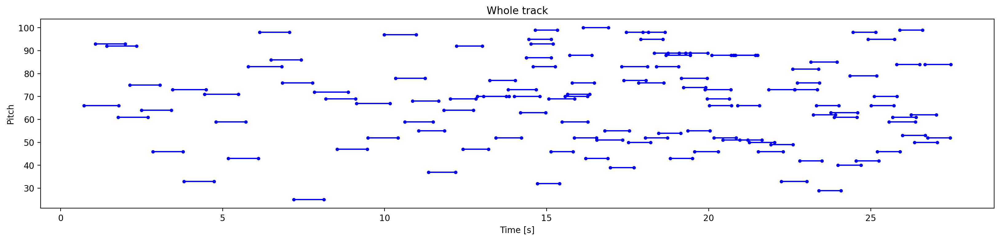

In [ ]:
plot_piano_roll(generated_notes)

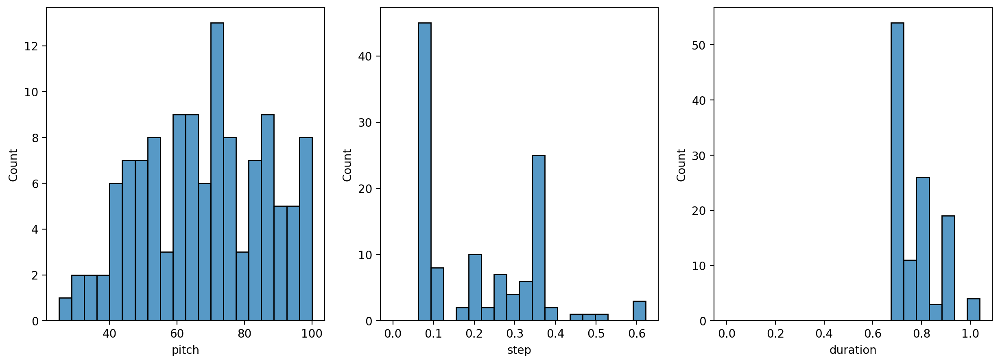

In [ ]:
#checking distribution of pitch step & duration
plot_distributions(generated_notes)

In [ ]:
#vocab_length at 100 & epochs at 25 again
out_file = 'output.mid'
out_pm = notes_to_midi(
    generated_notes, out_file=out_file, instrument_name=instrument_name)
display_audio(out_pm)

In [ ]:
#lr at 0.5 & epochs at 25
#1
out_file = 'output.mid'
out_pm = notes_to_midi(
    generated_notes, out_file=out_file, instrument_name=instrument_name)
display_audio(out_pm)

In [ ]:
#lr at 0.1 & epochs at 25
#2
out_file = 'output.mid'
out_pm = notes_to_midi(
    generated_notes, out_file=out_file, instrument_name=instrument_name)
display_audio(out_pm)

In [ ]:
out_file = 'output.mid'
out_pm = notes_to_midi(
    generated_notes, out_file=out_file, instrument_name=instrument_name)
display_audio(out_pm)

In [ ]:
out_file = 'output.mid'
#3 lr at 0.6 epochs at 25
out_pm = notes_to_midi(
    generated_notes, out_file=out_file, instrument_name=instrument_name)
display_audio(out_pm)

In [ ]:
#allows you to download audio files!
#from google.colab import files
#files.download(out_file)